<a href="https://colab.research.google.com/github/aaryamanz/autonomous-driving/blob/main/Autonomous_Driving.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [61]:
!git clone https://github.com/aaryamanz/autonomous-driving

fatal: destination path 'autonomous-driving' already exists and is not an empty directory.


In [62]:
!ls autonomous-driving

driving_log.csv  IMG


In [63]:
!pip3 install imgaug

In [64]:
import os
import numpy as np
import matplotlib.pyplot as plt
import keras
import matplotlib.image as mpimg
from keras.models import Sequential
from imgaug import augmenters as iaa
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import ntpath
import random

In [65]:
datadir = "autonomous-driving"
columns = ['center', 'left', 'right', 'steering','throttle','reverse','speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,/Users/aaryamansingh/Desktop/Data/IMG/center_2024_06_11_11_45_46_433.jpg,/Users/aaryamansingh/Desktop/Data/IMG/left_2024_06_11_11_45_46_433.jpg,/Users/aaryamansingh/Desktop/Data/IMG/right_2024_06_11_11_45_46_433.jpg,0.0,0.0,0.0,0.000079
1,/Users/aaryamansingh/Desktop/Data/IMG/center_2024_06_11_11_45_46_535.jpg,/Users/aaryamansingh/Desktop/Data/IMG/left_2024_06_11_11_45_46_535.jpg,/Users/aaryamansingh/Desktop/Data/IMG/right_2024_06_11_11_45_46_535.jpg,0.0,0.0,0.0,0.000079
2,/Users/aaryamansingh/Desktop/Data/IMG/center_2024_06_11_11_45_46_640.jpg,/Users/aaryamansingh/Desktop/Data/IMG/left_2024_06_11_11_45_46_640.jpg,/Users/aaryamansingh/Desktop/Data/IMG/right_2024_06_11_11_45_46_640.jpg,0.0,0.0,0.0,0.000078
3,/Users/aaryamansingh/Desktop/Data/IMG/center_2024_06_11_11_45_46_744.jpg,/Users/aaryamansingh/Desktop/Data/IMG/left_2024_06_11_11_45_46_744.jpg,/Users/aaryamansingh/Desktop/Data/IMG/right_2024_06_11_11_45_46_744.jpg,0.0,0.0,0.0,0.000078
4,/Users/aaryamansingh/Desktop/Data/IMG/center_2024_06_11_11_45_46_844.jpg,/Users/aaryamansingh/Desktop/Data/IMG/left_2024_06_11_11_45_46_844.jpg,/Users/aaryamansingh/Desktop/Data/IMG/right_2024_06_11_11_45_46_844.jpg,0.0,0.0,0.0,0.000078


In [66]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_06_11_11_45_46_433.jpg,left_2024_06_11_11_45_46_433.jpg,right_2024_06_11_11_45_46_433.jpg,0.0,0.0,0.0,0.000079
1,center_2024_06_11_11_45_46_535.jpg,left_2024_06_11_11_45_46_535.jpg,right_2024_06_11_11_45_46_535.jpg,0.0,0.0,0.0,0.000079
2,center_2024_06_11_11_45_46_640.jpg,left_2024_06_11_11_45_46_640.jpg,right_2024_06_11_11_45_46_640.jpg,0.0,0.0,0.0,0.000078
3,center_2024_06_11_11_45_46_744.jpg,left_2024_06_11_11_45_46_744.jpg,right_2024_06_11_11_45_46_744.jpg,0.0,0.0,0.0,0.000078
4,center_2024_06_11_11_45_46_844.jpg,left_2024_06_11_11_45_46_844.jpg,right_2024_06_11_11_45_46_844.jpg,0.0,0.0,0.0,0.000078


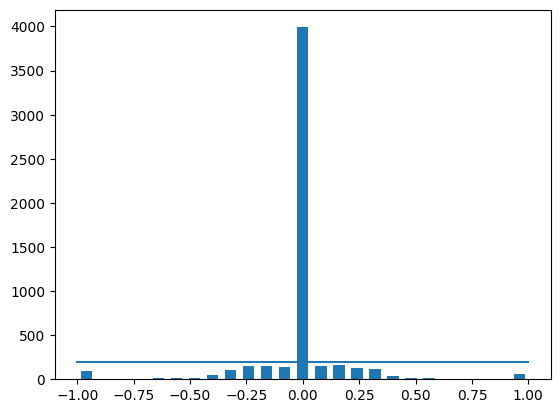

In [67]:
num_bins = 25
samples_per_bin = 200
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:])*0.5
plt.bar(center, hist, width = 0.05)
min_steering = np.min(data['steering'])
max_steering = np.max(data['steering'])
plt.plot([min_steering, max_steering], [samples_per_bin, samples_per_bin])
plt.show()

total data:  5438
removed 3791
remaining data:  1647


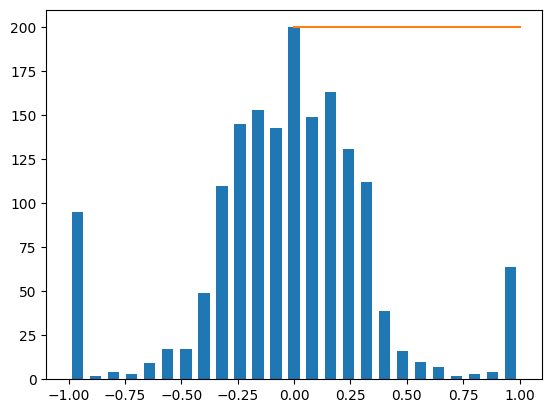

In [68]:
print('total data: ', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining data: ', len(data))
hist, _ = np.histogram(data['steering'], (num_bins))

plt.bar(center, hist, width = 0.05)
plt.plot(np.min(data['steering']), np.max(data['steering']), (samples_per_bin, samples_per_bin))



In [69]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right,  = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2024_06_11_11_45_48_690.jpg
left          left_2024_06_11_11_45_48_690.jpg
right        right_2024_06_11_11_45_48_690.jpg
steering                             -0.253524
throttle                                   1.0
reverse                                    0.0
speed                                 2.951692
Name: 22, dtype: object


In [70]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size = 0.2 , random_state = 6)
print('training samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

training samples: 1317
Valid Samples: 330


Text(0.5, 1.0, 'Validation Set')

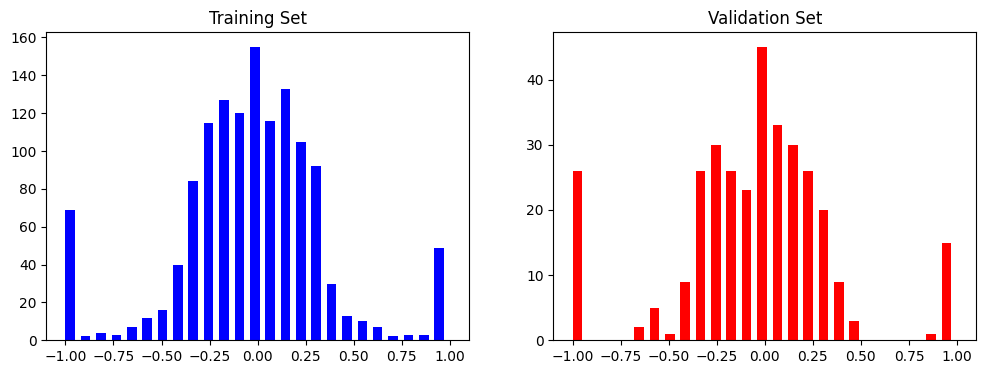

In [71]:
fig, axes = plt.subplots(1, 2, figsize=(12,4))
axes[0].hist(y_train, bins = num_bins, width=0.05, color='blue')
axes[0].set_title('Training Set')
axes[1].hist(y_valid, bins = num_bins, width=0.05, color='red')
axes[1].set_title('Validation Set')

In [72]:
def zoom(image):
  zoom = iaa.Affine(scale=(1,1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'zoomed Image')

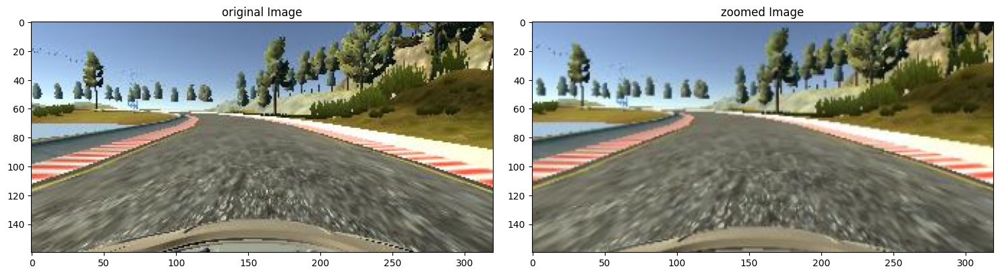

In [73]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('zoomed Image')

In [74]:
def pan(image):
  pan = iaa.Affine(translate_percent ={"x": (-0.1,0.1), "y": (-0.1,0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

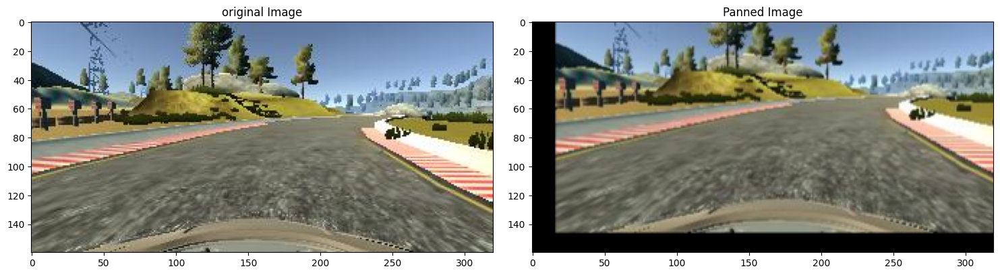

In [75]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [76]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

Text(0.5, 1.0, 'Brightness Image')

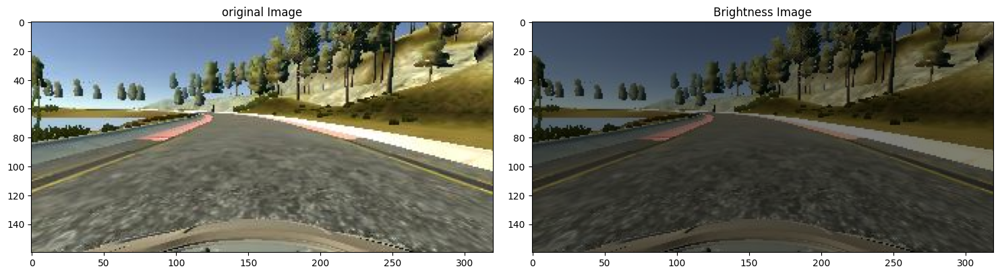

In [77]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
brightness_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original Image')

axs[1].imshow(brightness_image)
axs[1].set_title('Brightness Image')

In [78]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image,1)
  steering_angle = - steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'Flip Imagesteering angle: -0.7990149')

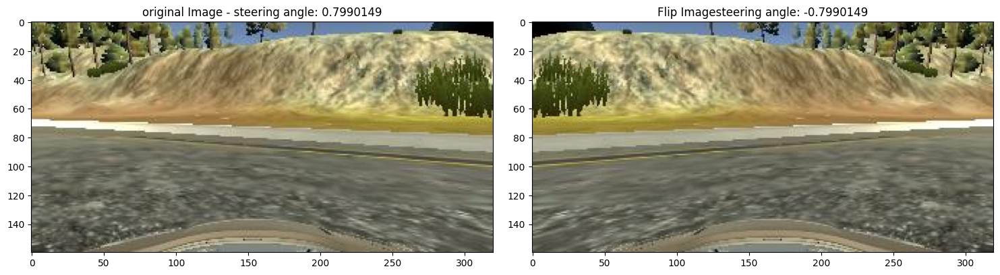

In [79]:
random_index = random.randint(0,1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
original_image = mpimg.imread(image)
flip_image, flip_steering = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original Image - ' + 'steering angle: ' + str(steering_angle))

axs[1].imshow(flip_image)
axs[1].set_title('Flip Image' + 'steering angle: ' + str(flip_steering))

In [80]:
def random_augment(image, steering_angle):
  image = mpimg.imread(image)

  if np.random.rand()<0.5:
    image = pan(image)
  if np.random.rand()<0.5:
    image = zoom(image)
  if np.random.rand()<0.5:
    image = img_random_brightness(image)
  if np.random.rand()<0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

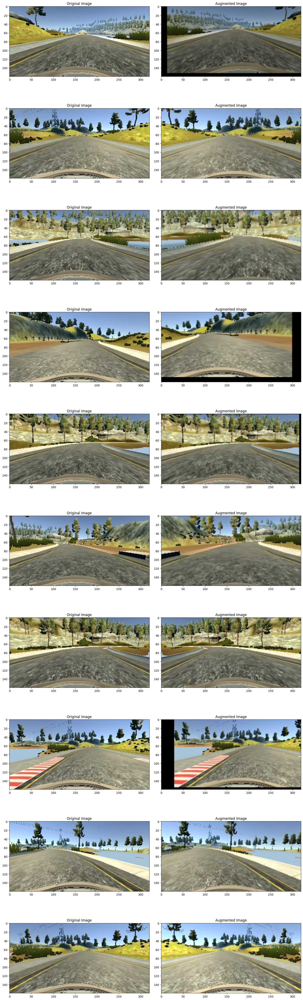

In [81]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title('Original Image')

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title('Augmented Image')

In [82]:
def img_preprocess(img):
  img = mpimg.imread(img)
  img = img[60:135, :,: ]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, (3,3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

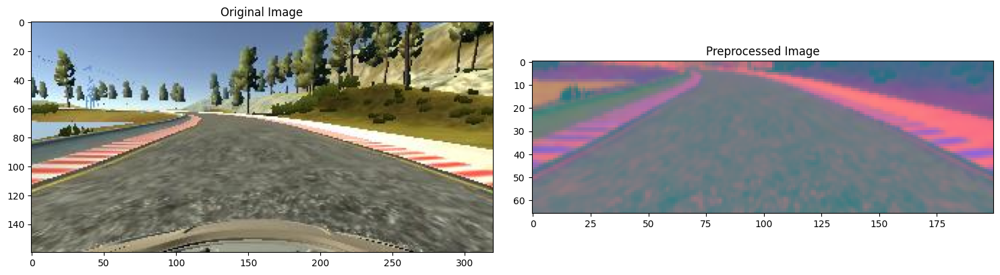

In [83]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(image)

fig, axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [84]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))


In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [86]:
X_train = np.array(list(map(img_preprocess, X_train)))
X_valid = np.array(list(map(img_preprocess, X_valid)))

(1317, 66, 200, 3)


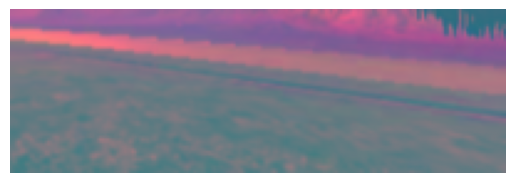

In [87]:
plt.imshow(X_train[random.randint(0, len(X_train) - 1)])
plt.axis('off')
print(X_train.shape)

In [88]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))
  model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Dropout(0.5))
  model.add(Flatten())
  model.add(Dense(100, activation='elu'))
  model.add(Dropout(0.5))
  model.add(Dense(50, activation='elu'))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation ='elu'))
  model.add(Dropout(0.5))
  model.add(Dense(1))
  optimizer= Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [89]:
model = nvidia_model()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 dropout_4 (Dropout)         (None, 1, 18, 64)         0         
                                                                 
 flatten_1 (Flatten)         (None, 1152)             

In [90]:
history = model.fit(X_train, y_train, epochs = 30, validation_data = (X_valid, y_valid), batch_size = 100, verbose=1, shuffle=1)



Epoch 1/30
14/14 [==============================] - 12s 620ms/step - loss: 0.9734 - val_loss: 0.1780
Epoch 2/30
14/14 [==============================] - 11s 775ms/step - loss: 0.2683 - val_loss: 0.1627
Epoch 3/30
14/14 [==============================] - 10s 698ms/step - loss: 0.1755 - val_loss: 0.1541
Epoch 4/30
14/14 [==============================] - 9s 636ms/step - loss: 0.1771 - val_loss: 0.1497
Epoch 5/30
14/14 [==============================] - 11s 764ms/step - loss: 0.1569 - val_loss: 0.1475
Epoch 6/30
14/14 [==============================] - 9s 675ms/step - loss: 0.1516 - val_loss: 0.1378
Epoch 7/30
14/14 [==============================] - 10s 676ms/step - loss: 0.1450 - val_loss: 0.1275
Epoch 8/30
14/14 [==============================] - 12s 845ms/step - loss: 0.1516 - val_loss: 0.1258
Epoch 9/30
14/14 [==============================] - 10s 694ms/step - loss: 0.1395 - val_loss: 0.1175
Epoch 10/30
14/14 [==============================] - 9s 644ms/step - loss: 0.1288 - val_loss:

Text(0.5, 0, 'Epoch')

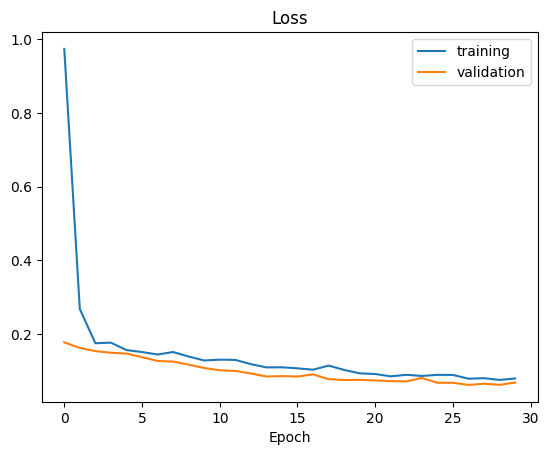

In [91]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [92]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [93]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>